<a href="https://colab.research.google.com/github/aqilahassan-hub/Multi-domain-Endoscopic-Surgeon-Action-Detection/blob/main/UpdatedYoloV5_New.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install torch

In [ ]:
import torch

In [ ]:
from IPython.display import Image #this is to render predictions

In [ ]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
!pip install -r requirements.txt

     |████████████████████████████████| 596 kB 27.0 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import os
from random import choice
import shutil

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset/Images/Train'
valPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset/Images/Val'
crsPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  128
Validation images are :  32


In [47]:
!python train.py --img 416 --batch 16 --epochs 100 --data /content/yolov5/yolov5/data/mesad-real.yaml  --weights yolov5s.pt  --cache


train: weights=yolov5s.pt, cfg=, data=/content/yolov5/yolov5/data/mesad-real.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-205-gbd815d4 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees

In [48]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

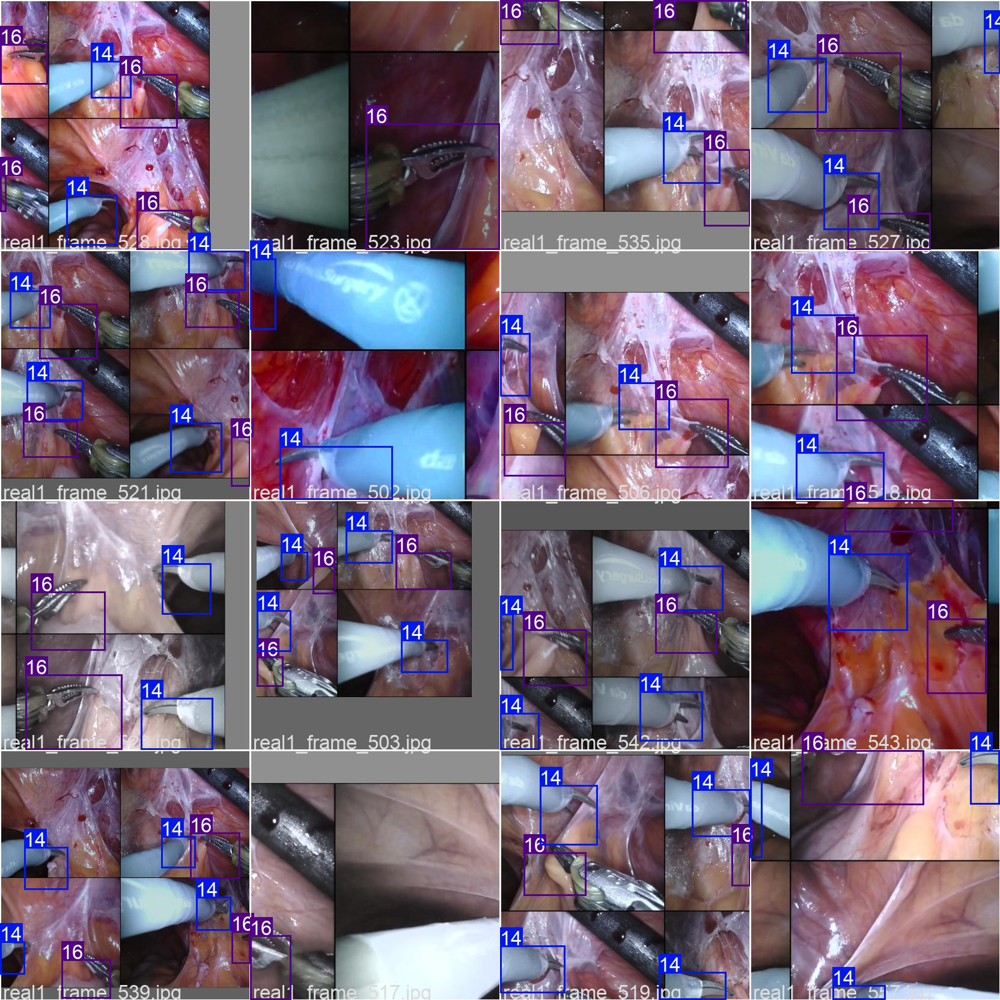

In [49]:
Image(filename='/content/yolov5/yolov5/runs/train/exp7/train_batch2.jpg', width=1000)

In [51]:
!python detect.py --source /content/yolov5/yolov5/runs/train/exp7/real1_frame_773.jpg --weights /content/yolov5/yolov5/runs/train/exp7/weights/best.pt

detect: weights=['/content/yolov5/yolov5/runs/train/exp7/weights/best.pt'], source=/content/yolov5/yolov5/runs/train/exp7/real1_frame_773.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-205-gbd815d4 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/yolov5/runs/train/exp7/real1_frame_773.jpg: 512x640 Done. (0.020s)
Speed: 0.5ms pre-process, 20.3ms inference, 0.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


In [53]:
!python detect.py --source /content/yolov5/yolov5/runs/train/exp7/real1_frame_513.jpg --weights /content/yolov5/yolov5/runs/train/exp7/weights/best.pt

detect: weights=['/content/yolov5/yolov5/runs/train/exp7/weights/best.pt'], source=/content/yolov5/yolov5/runs/train/exp7/real1_frame_513.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-205-gbd815d4 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/yolov5/runs/train/exp7/real1_frame_513.jpg: 512x640 1 CuttingMesocolon, Done. (0.019s)
Speed: 0.6ms pre-process, 18.6ms inference, 1.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


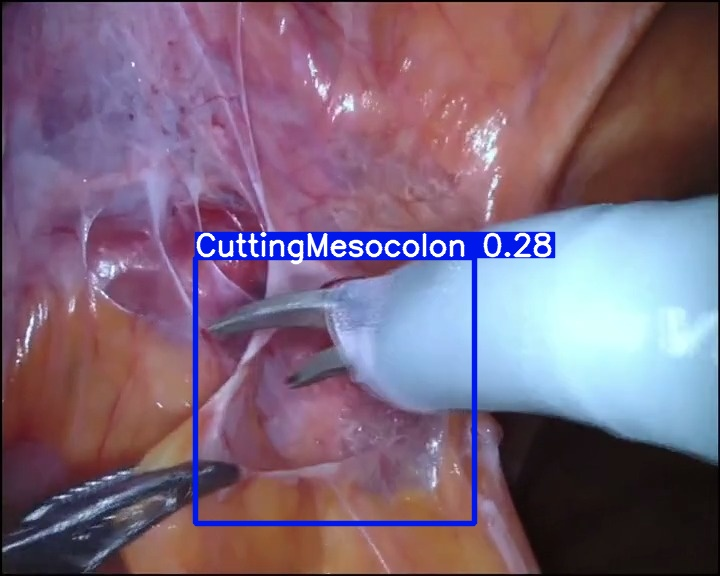

In [54]:
Image(filename='/content/yolov5/yolov5/runs/detect/exp3/real1_frame_513.jpg', width=1000)

In [58]:
from utils.plots import plot_results 
plot_results('/content/yolov5/yolov5/runs/train/exp7/results.csv') 